# Batch MAELIA — Plan d'Expérience SMT

Ce notebook :
1. Génère un plan d'expérience hiérarchique via **SMT** (espace de conception de `Try_MAELIA.ipynb`).
2. Convertit chaque point en fichier `dateDose.csv` compatible MAELIA.
3. Lance les simulations GAMA en mode **headless** (sans GUI).
4. Collecte et visualise les sorties.

**Suivi des logs en temps réel** — ouvrir un terminal et lancer :
```bash
tail -f /tmp/gama_smt.log
```

## 0. Imports & configuration

In [4]:
import os, sys, subprocess, time, io, warnings, shutil
from pathlib import Path
from datetime import date, timedelta
import xml.etree.ElementTree as ET

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

# SMT
from smt.design_space import FloatVariable, OrdinalVariable, CategoricalVariable
from smt_design_space_ext import AdsgDesignSpaceImpl

warnings.filterwarnings('ignore')
plt.rcParams.update({'figure.dpi': 120, 'savefig.bbox': 'tight'})

# ─── Chemins ──────────────────────────────────────────────────────────────────
GAMA_HEADLESS = '/Applications/Gama.app/Contents/headless/gama-headless.sh'
MAELIA_ROOT   = Path('/Users/benjamin/Workspace_GAMA/MAELIA')
MODEL_PATH    = MAELIA_ROOT / 'models/main/launcherBase.gaml'
LOG_DIR       = MAELIA_ROOT / 'models/main/log'
VARIANTS_DIR  = MAELIA_ROOT / 'includes/terrainTest/modeleAgricole/agriculteurs/variants_SMT'
BLOC_DONNEES  = MAELIA_ROOT / 'includes/terrainTest/modeleAgricole/blocsDonnees.csv'
XML_DIR       = Path('/tmp/maelia_smt_xml')
GAMA_LOG      = Path('/tmp/gama_smt.log')

# ─── Paramètres de simulation ─────────────────────────────────────────────────
ANNEE_DEBUT   = 2019
NB_ANNEES     = 3             # couvre 2019-2021 (campagne blé 2019 → récolte 2020)
ANNEES_DOSE   = [2019]        # une seule campagne de blé d'hiver
FINAL_STEP    = 1200
CROP          = 'ble'
NOM_DECOUPAGE = 'terrainTest'
CHEMIN_RACINE = str(MAELIA_ROOT) + '/'

# ─── Liste de toutes les parcelles du territoire ──────────────────────────────
_all_parcs = []
with open(BLOC_DONNEES) as _f:
    for _line in _f:
        _parts = [_p.strip() for _p in _line.strip().split(';') if _p.strip()]
        if len(_parts) >= 2:
            _all_parcs.append(_parts[1])   # parcelle principale
        if len(_parts) >= 3:
            _all_parcs.append(_parts[2])   # variante copie_*
ALL_PARCELLES = _all_parcs
print(f'Territoire : {len(ALL_PARCELLES)} parcelles chargées depuis blocsDonnees.csv')

# ─── Taille du DOE ────────────────────────────────────────────────────────────
N_SIMU = 100
N_DOE  = N_SIMU * len(ALL_PARCELLES)  # Un point unique par parcelle et par simulation

# ─── Création des dossiers ────────────────────────────────────────────────────
XML_DIR.mkdir(parents=True, exist_ok=True)
VARIANTS_DIR.mkdir(parents=True, exist_ok=True)

# ─── Nettoyage des anciens fichiers SMT ───────────────────────────────────────
old_dirs = sorted(LOG_DIR.glob('terrainTest_smt_*'))
if old_dirs:
    print(f'Nettoyage de {len(old_dirs)} anciens répertoire(s) de sortie SMT...')
    for d in old_dirs:
        shutil.rmtree(d)
    print('  OK.')

old_csvs = sorted(VARIANTS_DIR.glob('dateDose_smt_*.csv'))
if old_csvs:
    print(f'Nettoyage de {len(old_csvs)} anciens fichier(s) dateDose SMT...')
    for f in old_csvs:
        f.unlink()
    print('  OK.')

print('Configuration OK')
print(f'  Culture       : {CROP}')
print(f'  Campagne      : {ANNEES_DOSE}')
print(f'  Simulation    : {N_SIMU} runs')
print(f'  Parcelles     : {len(ALL_PARCELLES)}')
print(f'  Points DOE    : {N_DOE} (LHS distribué)')
print()
print('─' * 55)
print('Pour suivre les logs GAMA dans un terminal :')
print(f'  tail -f {GAMA_LOG}')
print('─' * 55)


Territoire : 130 parcelles chargées depuis blocsDonnees.csv
Nettoyage de 100 anciens répertoire(s) de sortie SMT...
  OK.
Nettoyage de 100 anciens fichier(s) dateDose SMT...
  OK.
Configuration OK
  Culture       : ble
  Campagne      : [2019]
  Simulation    : 100 runs
  Parcelles     : 130
  Points DOE    : 13000 (LHS distribué)

───────────────────────────────────────────────────────
Pour suivre les logs GAMA dans un terminal :
  tail -f /tmp/gama_smt.log
───────────────────────────────────────────────────────


## 1. Espace de conception SMT

Reprise de l'espace de conception hiérarchique défini dans `Try_MAELIA.ipynb` (26 variables : 14 discrètes/catégorielles + 12 continues).

In [5]:
# ─── Types de préparation et de fertilisation ─────────────────────────────────
prepa_types = ['Labour', 'Preparation du lit de semence', 'Déchaumage', 'Roulage']
ferti_types = ['N_solution', 'AN', 'mineral', 'urea']

# Notes sur le calibrage des variables continues pour le blé d'hiver :
#   - Jour_Semis        : 260–320  (semis automnal mi-sept → mi-nov)
#   - Jours_Semis_avant_PREPA : 1–30 (préparation du sol 0-30 j avant semis)
#   - Jours_Semis_vers_F1 : 100–250 (ferti printanière 100-250 j après semis)
#   - Jours_F1_vers_F2  : 1–60   (2e apport printanier 2-8 semaines après le 1er)
#   - Jours_F2_vers_F3  : 1–60   (idem)
#   - Jours_dernière_op_vers_Récolte : 1–200 (récolte estivale)

agri_design_space = AdsgDesignSpaceImpl(
    design_variables=[
        # --- Bloc discret (tags uniques) ---
        OrdinalVariable(['0_ferti', '1_ferti', '2_ferti', '3_ferti']),  # 0: n_ferti
        OrdinalVariable(['Non_prepa', 'Oui_prepa']),                    # 1: has_prepa
        OrdinalVariable(['1_prepa', '2_prepa']),                        # 2: nb_prepa
        CategoricalVariable([p + '_p1' for p in prepa_types]),          # 3: prepa_1
        CategoricalVariable([p + '_p2' for p in prepa_types]),          # 4: prepa_2

        OrdinalVariable(['1_f1', '2_f1']),                              # 5: Nb produits F1
        CategoricalVariable([f + '_f11' for f in ferti_types]),         # 6: type F1_1
        CategoricalVariable([f + '_f12' for f in ferti_types]),         # 7: type F1_2

        OrdinalVariable(['1_f2', '2_f2']),                              # 8: Nb produits F2
        CategoricalVariable([f + '_f21' for f in ferti_types]),         # 9: type F2_1
        CategoricalVariable([f + '_f22' for f in ferti_types]),         # 10: type F2_2

        OrdinalVariable(['1_f3', '2_f3']),                              # 11: Nb produits F3
        CategoricalVariable([f + '_f31' for f in ferti_types]),         # 12: type F3_1
        CategoricalVariable([f + '_f32' for f in ferti_types]),         # 13: type F3_2

        # --- Bloc continu -----------------------------------------------
        FloatVariable(260, 320),   # 14: Jour_Semis (semis automnal, blé d'hiver)
        FloatVariable(1,   30),    # 15: Jours_Semis_avant_PREPA
        FloatVariable(100, 250),   # 16: Jours_Semis_vers_F1 (ferti printanière)
        FloatVariable(1,   60),    # 17: Jours_F1_vers_F2
        FloatVariable(1,   60),    # 18: Jours_F2_vers_F3
        FloatVariable(1,   200),   # 19: Jours_dernière_op_vers_Récolte
        FloatVariable(10,  100),   # 20: dose F1_1
        FloatVariable(10,  100),   # 21: dose F1_2
        FloatVariable(10,  100),   # 22: dose F2_1
        FloatVariable(10,  100),   # 23: dose F2_2
        FloatVariable(10,  100),   # 24: dose F3_1
        FloatVariable(10,  100),   # 25: dose F3_2
    ]
)

# ─── Hiérarchie ADSG ─────────────────────────────────────────────────────────
agri_design_space.declare_decreed_var(decreed_var=2,  meta_var=1, meta_value=['Oui_prepa'])
agri_design_space.declare_decreed_var(decreed_var=3,  meta_var=1, meta_value=['Oui_prepa'])
agri_design_space.declare_decreed_var(decreed_var=15, meta_var=1, meta_value=['Oui_prepa'])
agri_design_space.declare_decreed_var(decreed_var=4,  meta_var=2, meta_value=['2_prepa'])

agri_design_space.declare_decreed_var(decreed_var=16, meta_var=0, meta_value=['1_ferti', '2_ferti', '3_ferti'])
agri_design_space.declare_decreed_var(decreed_var=5,  meta_var=0, meta_value=['1_ferti', '2_ferti', '3_ferti'])
agri_design_space.declare_decreed_var(decreed_var=6,  meta_var=0, meta_value=['1_ferti', '2_ferti', '3_ferti'])
agri_design_space.declare_decreed_var(decreed_var=20, meta_var=0, meta_value=['1_ferti', '2_ferti', '3_ferti'])
agri_design_space.declare_decreed_var(decreed_var=7,  meta_var=5, meta_value=['2_f1'])
agri_design_space.declare_decreed_var(decreed_var=21, meta_var=5, meta_value=['2_f1'])

agri_design_space.declare_decreed_var(decreed_var=17, meta_var=0, meta_value=['2_ferti', '3_ferti'])
agri_design_space.declare_decreed_var(decreed_var=8,  meta_var=0, meta_value=['2_ferti', '3_ferti'])
agri_design_space.declare_decreed_var(decreed_var=9,  meta_var=0, meta_value=['2_ferti', '3_ferti'])
agri_design_space.declare_decreed_var(decreed_var=22, meta_var=0, meta_value=['2_ferti', '3_ferti'])
agri_design_space.declare_decreed_var(decreed_var=10, meta_var=8, meta_value=['2_f2'])
agri_design_space.declare_decreed_var(decreed_var=23, meta_var=8, meta_value=['2_f2'])

agri_design_space.declare_decreed_var(decreed_var=18, meta_var=0, meta_value=['3_ferti'])
agri_design_space.declare_decreed_var(decreed_var=11, meta_var=0, meta_value=['3_ferti'])
agri_design_space.declare_decreed_var(decreed_var=12, meta_var=0, meta_value=['3_ferti'])
agri_design_space.declare_decreed_var(decreed_var=24, meta_var=0, meta_value=['3_ferti'])
agri_design_space.declare_decreed_var(decreed_var=13, meta_var=11, meta_value=['2_f3'])
agri_design_space.declare_decreed_var(decreed_var=25, meta_var=11, meta_value=['2_f3'])

print('Espace de conception SMT défini :', len(agri_design_space.design_variables), 'variables')
print('  Jour_Semis      : 260–320  (semis automnal blé d\'hiver)')
print('  Jours_vers_F1   : 100–250  (ferti printanière)')
print('  Jours_F1_vs_F2/3: 1–60    (inter-apports printaniers)')


# ─── Fonctions de décodage (issues de Try_MAELIA.ipynb) ──────────────────────

def parse_smt_row(row_data):
    """Analyse une ligne décodée par SMT en cherchant les tags uniques."""
    parsed = {
        'n_ferti': 0, 'has_prepa': False, 'nb_prepa': 1,
        'nb_f1': 1, 'nb_f2': 1, 'nb_f3': 1,
        'prepa_t1': '-', 'prepa_t2': '-',
        'f1_t1': '-', 'f1_t2': '-',
        'f2_t1': '-', 'f2_t2': '-',
        'f3_t1': '-', 'f3_t2': '-',
        'floats': []
    }
    values = list(row_data.values()) if isinstance(row_data, dict) else row_data
    for val in values:
        if isinstance(val, (float, int)):
            parsed['floats'].append(float(val))
        elif isinstance(val, str):
            if '_ferti' in val:          parsed['n_ferti']  = int(val[0])
            elif val in ('Oui_prepa', 'Non_prepa'): parsed['has_prepa'] = (val == 'Oui_prepa')
            elif '_prepa' in val:        parsed['nb_prepa'] = int(val[0])
            elif '_p1' in val:           parsed['prepa_t1'] = val.replace('_p1', '')
            elif '_p2' in val:           parsed['prepa_t2'] = val.replace('_p2', '')
            elif '_f11' in val:          parsed['f1_t1']    = val.replace('_f11', '')
            elif '_f12' in val:          parsed['f1_t2']    = val.replace('_f12', '')
            elif val in ('1_f1', '2_f1'): parsed['nb_f1']   = int(val[0])
            elif '_f21' in val:          parsed['f2_t1']    = val.replace('_f21', '')
            elif '_f22' in val:          parsed['f2_t2']    = val.replace('_f22', '')
            elif val in ('1_f2', '2_f2'): parsed['nb_f2']   = int(val[0])
            elif '_f31' in val:          parsed['f3_t1']    = val.replace('_f31', '')
            elif '_f32' in val:          parsed['f3_t2']    = val.replace('_f32', '')
            elif val in ('1_f3', '2_f3'): parsed['nb_f3']   = int(val[0])
    return parsed


def extract_table_from_smt(x_array, dsg_space):
    """Construit un DataFrame lisible depuis la matrice DOE."""
    results = []
    decoded = dsg_space.decode_values(x_array)
    for row_data in decoded:
        p  = parse_smt_row(row_data)
        fl = p['floats']
        while len(fl) < 12:
            fl.append(float('nan'))

        semi = int(round(fl[0]))
        prepa_date = int(round(max(1, semi - fl[1]))) if p['has_prepa'] else None
        f1_date = int(round(semi + fl[2])) if p['n_ferti'] >= 1 else None
        f2_date = int(round(f1_date + fl[3])) if p['n_ferti'] >= 2 and f1_date else None
        f3_date = int(round(f2_date + fl[4])) if p['n_ferti'] >= 3 and f2_date else None
        last    = f3_date or f2_date or f1_date or (prepa_date or semi)
        recolte = int(round(last + fl[5]))

        def _d(v): return v if v else '-'
        def _r(v): return round(float(v), 1) if v == v else '-'

        results.append({
            'n_ferti':    p['n_ferti'],
            'has_prepa':  'Oui' if p['has_prepa'] else 'Non',
            'Semis_jj':   semi,
            'PREPA_jj':   _d(prepa_date),
            'PREPA_T1':   p['prepa_t1'],
            'PREPA_T2':   p['prepa_t2'] if p['nb_prepa'] == 2 else '-',
            'F1_jj':      _d(f1_date),
            'F1_T1':      p['f1_t1'],   'F1_D1': _r(fl[6]),
            'F1_T2':      p['f1_t2'] if p['nb_f1'] == 2 else '-',
            'F1_D2':      _r(fl[7]) if p['nb_f1'] == 2 else '-',
            'F2_jj':      _d(f2_date),
            'F2_T1':      p['f2_t1'],   'F2_D1': _r(fl[8]),
            'F3_jj':      _d(f3_date),
            'F3_T1':      p['f3_t1'],   'F3_D1': _r(fl[10]),
            'Recolte_jj': recolte,
        })
    return pd.DataFrame(results)

Espace de conception SMT défini : 26 variables
  Jour_Semis      : 260–320  (semis automnal blé d'hiver)
  Jours_vers_F1   : 100–250  (ferti printanière)
  Jours_F1_vs_F2/3: 1–60    (inter-apports printaniers)


## 2. Génération du plan d'expérience (DOE)

In [6]:
print(f'Génération de {N_DOE} points LHS hiérarchiques (SMT ADSG)...')
result = agri_design_space._sample_valid_x(N_DOE)
xt, is_acting_t = result[0], result[1]
print(f'Matrice DOE : {xt.shape[0]} × {xt.shape[1]} variables')
print()

doe_display = extract_table_from_smt(xt, agri_design_space)
print(f'Aperçu du plan d\'expérience (N={N_DOE}) :')
display(doe_display)

Génération de 13000 points LHS hiérarchiques (SMT ADSG)...
Matrice DOE : 13000 × 26 variables

Aperçu du plan d'expérience (N=13000) :


,n_ferti,has_prepa,Semis_jj,PREPA_jj,PREPA_T1,PREPA_T2,F1_jj,F1_T1,F1_D1,F1_T2,F1_D2,F2_jj,F2_T1,F2_D1,F3_jj,F3_T1,F3_D1,Recolte_jj
0,3,Non,290,-,Labour,-,433,AN,94.0,N_solution,44.5,446,urea,49.8,457,urea,41.8,623
1,1,Non,290,-,Labour,-,444,mineral,76.9,-,-,-,N_solution,55.0,-,N_solution,55.0,621
2,2,Non,302,-,Labour,-,492,urea,18.9,-,-,518,N_solution,30.6,-,N_solution,55.0,701
3,3,Non,304,-,Labour,-,444,AN,22.3,-,-,462,urea,63.9,504,N_solution,23.7,625
4,0,Oui,294,288,Déchaumage,-,-,N_solution,55.0,-,-,-,N_solution,55.0,-,N_solution,55.0,311
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12995,2,Oui,289,268,Roulage,Labour,400,mineral,66.3,AN,23.3,438,urea,61.0,-,N_solution,55.0,626
12996,1,Oui,286,281,Preparationdulitdesemence,Labour,535,N_solution,28.1,urea,88.8,-,N_solution,55.0,-,N_solution,55.0,678
12997,1,Oui,290,269,Preparationdulitdesemence,-,481,AN,29.8,-,-,-,N_solution,55.0,-,N_solution,55.0,636
12998,3,Non,265,-,Labour,-,394,urea,28.1,-,-,442,N_solution,64.3,466,urea,19.8,525


## 3. Génération des fichiers `dateDose.csv`

Chaque point du DOE est converti en fichier `dateDose_smt_XXX.csv` au format MAELIA :
- **PREPA** : `fl[1]` jours **avant** le semis (préparation du sol).
- **SEMIS** : jour `fl[0]` de l'année.
- **FERTI_Min** : `fl[2]` jours après semis (F1), puis `fl[3]` jours pour F2, `fl[4]` pour F3.
- **RECOLTE** : `fl[5]` jours après la dernière opération.

In [7]:
PREPA_DEPTHS = {
    'Labour': '24',
    'Preparation du lit de semence': '10',
    'Déchaumage': '',
    'Roulage': '',
}

COLS = ['Trait', 'nom_MAELIA', 'plant_sem', 'annee_deb',
        'id_operation', 'ordre_op', 'DATE', 'PROF', 'TYPE', 'DOSE']

MIN_GROWING_DAYS = 200

def doy_to_date_str(year, doy):
    return (date(year, 1, 1) + timedelta(days=int(doy) - 1)).strftime('%d/%m/%Y')

def safe_f(val, default=50.0):
    try:
        v = float(val)
        return default if v != v else v
    except (TypeError, ValueError):
        return default

def generate_ops_for_parcelle(point_idx, parcelle_id, years):
    """Génère les opérations pour un SEUL point DOE appliqué à une SEULE parcelle."""
    decoded = agri_design_space.decode_values(xt[point_idx:point_idx + 1])
    p  = parse_smt_row(decoded[0])
    fl = [safe_f(v) for v in p['floats']]
    while len(fl) < 12: fl.append(50.0)

    ops = []
    for year in years:
        semi_doy  = max(1, int(round(fl[0])))
        prepa_doy = max(1, semi_doy - int(round(fl[1]))) if p['has_prepa'] else None
        f1_doy    = int(round(semi_doy + fl[2])) if p['n_ferti'] >= 1 else None
        f2_doy    = int(round(f1_doy  + fl[3])) if p['n_ferti'] >= 2 and f1_doy else None
        f3_doy    = int(round(f2_doy  + fl[4])) if p['n_ferti'] >= 3 and f2_doy else None
        last_doy  = f3_doy or f2_doy or f1_doy or semi_doy
        rec_doy   = max(semi_doy + MIN_GROWING_DAYS, int(round(last_doy + fl[5])))

        base = {'Trait': parcelle_id, 'nom_MAELIA': f'P1_{year}',
                'plant_sem': CROP, 'annee_deb': year}

        if p['has_prepa']:
            ops.append({**base, 'id_operation': 'PREPA', 'ordre_op': '',
                        'DATE': doy_to_date_str(year, prepa_doy),
                        'PROF': PREPA_DEPTHS.get(p['prepa_t1'], ''), 'TYPE': p['prepa_t1'], 'DOSE': ''})
            if p['nb_prepa'] == 2:
                ops.append({**base, 'id_operation': 'PREPA', 'ordre_op': '2',
                            'DATE': doy_to_date_str(year, prepa_doy),
                            'PROF': PREPA_DEPTHS.get(p['prepa_t2'], ''), 'TYPE': p['prepa_t2'], 'DOSE': ''})

        ops.append({**base, 'id_operation': 'SEMIS', 'ordre_op': '',
                    'DATE': doy_to_date_str(year, semi_doy),
                    'PROF': '', 'TYPE': '', 'DOSE': ''})

        ferti_events = []
        if f1_doy: ferti_events.append((f1_doy, p['nb_f1'], p['f1_t1'], fl[6],  p['f1_t2'], fl[7]))
        if f2_doy: ferti_events.append((f2_doy, p['nb_f2'], p['f2_t1'], fl[8],  p['f2_t2'], fl[9]))
        if f3_doy: ferti_events.append((f3_doy, p['nb_f3'], p['f3_t1'], fl[10], p['f3_t2'], fl[11]))

        for ordre, (doy, nb, t1, d1, t2, d2) in enumerate(ferti_events, 1):
            ds = doy_to_date_str(year, doy)
            ops.append({**base, 'id_operation': 'FERTI_Min', 'ordre_op': str(ordre),
                        'DATE': ds, 'PROF': '', 'TYPE': t1, 'DOSE': str(round(d1, 1))})
            if nb == 2:
                ops.append({**base, 'id_operation': 'FERTI_Min', 'ordre_op': str(ordre),
                            'DATE': ds, 'PROF': '', 'TYPE': t2, 'DOSE': str(round(d2, 1))})

        ops.append({**base, 'id_operation': 'RECOLTE', 'ordre_op': '',
                    'DATE': doy_to_date_str(year, rec_doy),
                    'PROF': '', 'TYPE': '', 'DOSE': ''})
    return ops

# ─── Générer tous les fichiers dateDose (100 fichiers, 130 parcelles/fichier) ───
print(f'Génération de {N_SIMU} fichiers dateDose distribués...')
for i in range(N_SIMU):
    path = VARIANTS_DIR / f'dateDose_smt_{i:03d}.csv'
    all_ops = []
    for j, parcelle_id in enumerate(ALL_PARCELLES):
        point_idx = i * len(ALL_PARCELLES) + j
        all_ops.extend(generate_ops_for_parcelle(point_idx, parcelle_id, ANNEES_DOSE))
    
    df = pd.DataFrame(all_ops, columns=COLS)
    df.to_csv(path, sep=';', index=False)
    if i % 10 == 0 or i == N_SIMU - 1:
        print(f'  Simulation {i:03d} : {len(df)} opérations ({len(ALL_PARCELLES)} parcelles traitées)')

print(f'\nFichiers écrits dans : {VARIANTS_DIR}')


Génération de 100 fichiers dateDose distribués...
  Simulation 000 : 650 opérations (130 parcelles traitées)
  Simulation 010 : 646 opérations (130 parcelles traitées)
  Simulation 020 : 651 opérations (130 parcelles traitées)
  Simulation 030 : 644 opérations (130 parcelles traitées)
  Simulation 040 : 673 opérations (130 parcelles traitées)
  Simulation 050 : 638 opérations (130 parcelles traitées)
  Simulation 060 : 664 opérations (130 parcelles traitées)
  Simulation 070 : 617 opérations (130 parcelles traitées)
  Simulation 080 : 629 opérations (130 parcelles traitées)
  Simulation 090 : 664 opérations (130 parcelles traitées)
  Simulation 099 : 660 opérations (130 parcelles traitées)

Fichiers écrits dans : /Users/benjamin/Workspace_GAMA/MAELIA/includes/terrainTest/modeleAgricole/agriculteurs/variants_SMT


In [8]:
df.head(20)

,Trait,nom_MAELIA,plant_sem,annee_deb,id_operation,ordre_op,DATE,PROF,TYPE,DOSE
0,beauce_17_1,P1_2019,ble,2019,SEMIS,,02/11/2019,,,
1,beauce_17_1,P1_2019,ble,2019,FERTI_Min,1,27/05/2020,,urea,89.0
2,beauce_17_1,P1_2019,ble,2019,FERTI_Min,2,27/06/2020,,urea,69.0
3,beauce_17_1,P1_2019,ble,2019,RECOLTE,,25/10/2020,,,
4,beauce_29_1,P1_2019,ble,2019,SEMIS,,16/10/2019,,,
5,beauce_29_1,P1_2019,ble,2019,FERTI_Min,1,23/02/2020,,mineral,82.5
6,beauce_29_1,P1_2019,ble,2019,FERTI_Min,1,23/02/2020,,urea,46.0
7,beauce_29_1,P1_2019,ble,2019,RECOLTE,,29/07/2020,,,
8,beauce_41_1,P1_2019,ble,2019,PREPA,,01/09/2019,,Déchaumage,
9,beauce_41_1,P1_2019,ble,2019,PREPA,2,01/09/2019,,Preparationdulitdesemence,


## 4. Lancement des simulations GAMA (headless)

Chaque simulation :
1. Génère un fichier XML de plan d'expérience GAMA.
2. Lance `gama-headless.sh` avec ce XML.
3. Stream les logs vers `/tmp/gama_smt.log` **et** vers la sortie de la cellule.

> Pour suivre les logs depuis un terminal : `tail -f /tmp/gama_smt.log`

In [18]:
# ─── Générateur XML headless ──────────────────────────────────────────────────

def make_xml(nom_simu, datedose_path):
    """Génère le contenu XML du plan d'expérience GAMA headless."""
    root = ET.Element('Experiment_plan')
    sim  = ET.SubElement(root, 'Simulation')
    sim.set('experiment',  'simulationBase')
    sim.set('finalStep',   str(FINAL_STEP))
    sim.set('id',          '0')
    sim.set('seed',        '1.0')
    sim.set('sourcePath',  str(MODEL_PATH))

    params = ET.SubElement(sim, 'Parameters')

    def p(name, ptype, value, var):
        el = ET.SubElement(params, 'Parameter')
        el.set('name', name)
        el.set('type', ptype)
        el.set('value', str(value))
        el.set('var', var)

    p('executerSurCluster: ',                  'BOOLEAN', 'false',                               'executerSurCluster')
    p('cheminRacineMaelia',                    'STRING',  CHEMIN_RACINE,                         'cheminRacineMaelia')
    p('cheminModeleVersDonnees',               'STRING',  str(MAELIA_ROOT / 'includes') + '/',   'cheminModeleVersDonnees')
    p('cheminSorties',                         'STRING',  str(LOG_DIR),                          'cheminRelatifDuDossierDeSortieDeSimulation')
    p('anneeDebutSimulation : ',               'INT',     ANNEE_DEBUT,                           'anneeDebutSimulation')
    p('nbAnneesSimulation : ',                 'INT',     NB_ANNEES,                             'nbAnneesSimulation')
    p('nomSimulation : ',                      'STRING',  nom_simu,                              'nomSimulation')
    p('nomDecoupageZonePourLectureFichiers : ', 'STRING',  NOM_DECOUPAGE,                         'nomDecoupageZonePourLectureFichiers')
    p('executerModeleAgricole : ',             'BOOLEAN', 'true',                                'executerModeleAgricole')
    p('nomChoixAssolement : ',                 'STRING',  'DateDose',                            'nomChoixAssolement')
    p('fichierDateDose : ',                    'STRING',  str(datedose_path),                    'fichierDateDose')
    p('avecContrainteDeMainOeuvre : ',         'BOOLEAN', 'false',                               'avecContrainteDeMainOeuvre')
    p('isIrrigationSimulee : ',                'BOOLEAN', 'false',                               'isIrrigationSimulee')
    p('executerModeleHydrographique : ',       'BOOLEAN', 'false',                               'executerModeleHydrographique')
    p('executerModeleNormatif : ',             'BOOLEAN', 'false',                               'executerModeleNormatif')
    p('executerEcritureFichiers : ',           'BOOLEAN', 'true',                                'executerEcritureFichiers')
    p('sorties eau',                           'BOOLEAN', 'true',                                'sorties_eau')
    p('sorties azote',                         'BOOLEAN', 'true',                                'sorties_azote')
    p('sorties carbone et GES',                'BOOLEAN', 'true',                                'sorties_carboneGES')
    p('Sortie N_Cstock_Parcelles',             'BOOLEAN', 'true',                                'N_Cstock_Parcelles')
    p('Sortie N_lixi_Parcelles',               'BOOLEAN', 'true',                                'N_lixi_Parcelles')
    # Note: 'suiviOTParParcelle' est déjà true par défaut dans launcherBase.gaml.
    # Son label GAML contient des accents ('Suivi détaillé…') qui ne peuvent pas
    # être encodés sans risque dans le XML headless → paramètre omis volontairement.

    ET.SubElement(sim, 'Outputs')

    try:
        ET.indent(root, space='  ')
    except AttributeError:
        pass  # Python < 3.9

    buf = io.BytesIO()
    ET.ElementTree(root).write(buf, encoding='UTF-8', xml_declaration=True)
    xml_str = buf.getvalue().decode('UTF-8')
    # Normaliser la déclaration XML (double quotes)
    xml_str = xml_str.replace("<?xml version='1.0' encoding='UTF-8'?>",
                              '<?xml version="1.0" encoding="UTF-8" standalone="no"?>')
    return xml_str


# ─── Fonction de lancement + streaming des logs ───────────────────────────────

def find_output_dir(nom_simu, ts_before):
    """Trouve le répertoire de sortie MAELIA créé après ts_before."""
    prefix = f'{NOM_DECOUPAGE}_{nom_simu}_'
    for _ in range(15):
        matches = [
            p for p in LOG_DIR.glob(f'{prefix}*')
            if p.is_dir() and p.stat().st_mtime >= ts_before
        ]
        if matches:
            return sorted(matches, key=lambda p: p.stat().st_mtime)[-1]
        time.sleep(1)
    return None


def run_simulation(nom_simu, xml_path, gama_ws):
    """
    Lance une simulation GAMA headless.
    Streame stdout/stderr vers GAMA_LOG ET vers la sortie de la cellule.
    Retourne (code_retour, out_dir | None).
    """
    gama_ws.mkdir(parents=True, exist_ok=True)
    cmd = ['bash', GAMA_HEADLESS, str(xml_path), str(gama_ws)]
    t0  = time.time()
    ts_before = t0 - 0.5

    print(f'\n{"─" * 62}')
    print(f'  Simulation : {nom_simu}')
    print(f'  Commande   : {" ".join(cmd)}')
    print(f'{"─" * 62}', flush=True)

    with open(GAMA_LOG, 'a') as flog:
        flog.write(f'\n{"=" * 62}\n[{nom_simu}] {time.strftime("%H:%M:%S")}\n{"=" * 62}\n')
        proc = subprocess.Popen(
            cmd,
            stdout=subprocess.PIPE,
            stderr=subprocess.STDOUT,
            text=True,
            bufsize=1
        )
        for line in proc.stdout:
            sys.stdout.write(line)
            sys.stdout.flush()
            flog.write(line)
            flog.flush()
        proc.wait()

    elapsed  = time.time() - t0
    ok       = (proc.returncode == 0)
    out_dir  = find_output_dir(nom_simu, ts_before) if ok else None
    status   = 'OK' if ok else f'ERREUR (code {proc.returncode})'

    print(f'\n  [{status}] {nom_simu} terminé en {elapsed:.1f}s', flush=True)
    if out_dir:
        print(f'  Sorties    : {out_dir.name}', flush=True)
    return proc.returncode, out_dir

In [ ]:
# ─── Boucle principale ────────────────────────────────────────────────────────

# Vider le fichier de log
GAMA_LOG.write_text('')
print(f'Log GAMA → {GAMA_LOG}')
print('Pour suivre en temps réel dans un terminal :')
print(f'  tail -f {GAMA_LOG}')
print()

results = {}    # nom_simu → Path | None
t_global = time.time()

for i in range(N_DOE):
    nom_simu  = f'smt_{i:03d}'
    csv_path  = VARIANTS_DIR / f'dateDose_{nom_simu}.csv'
    xml_path  = XML_DIR / f'{nom_simu}.xml'
    gama_ws   = XML_DIR / f'ws_{nom_simu}'

    # Écrire le XML
    xml_path.write_text(make_xml(nom_simu, csv_path))

    # Lancer la simulation
    ret, out_dir = run_simulation(nom_simu, xml_path, gama_ws)
    results[nom_simu] = out_dir

n_ok    = sum(1 for v in results.values() if v is not None)
elapsed = time.time() - t_global
print(f'\n{"═" * 62}')
print(f'  Terminé : {n_ok}/{N_DOE} simulations OK  ({elapsed:.0f}s total)')
print(f'{"═" * 62}')

Log GAMA → /tmp/gama_smt.log
Pour suivre en temps réel dans un terminal :
  tail -f /tmp/gama_smt.log


──────────────────────────────────────────────────────────────
  Simulation : smt_000
  Commande   : bash /Applications/Gama.app/Contents/headless/gama-headless.sh /tmp/maelia_smt_xml/smt_000.xml /tmp/maelia_smt_xml/ws_smt_000
──────────────────────────────────────────────────────────────
******************************************************************
* GAMA version 2026.4.7-SNAPSHOT                                         *
* http://gama-platform.org                                       *
* (c) 2007-2025 UMI 209 UMMISCO IRD/SU & Partners                *
******************************************************************
find: illegal option -- n
usage: find [-H | -L | -P] [-EXdsx] [-f path] path ... [expression]
       find [-H | -L | -P] [-EXdsx] -f path [path ...] [expression]
> FLAG  : enable_debug                                  set to________ true
> FLAG  : enable_logging 

In [9]:
# ─── Reconstruction des résultats depuis le répertoire de logs ────────────────
# Exécuter cette cellule si les simulations ont déjà tourné mais que `results`
# n'est plus en mémoire (kernel redémarré, revert, etc.).

import re as _re

_pat = _re.compile(
    r'^terrainTest_(smt_\d+)_\d{4}-\d{2}-\d{2}_\d{2}_\d{2}_\d{2}$'
)

# Pour chaque run index, garde le dossier le plus récent (mtime)
_latest = {}
for _d in LOG_DIR.iterdir():
    if not _d.is_dir():
        continue
    _m = _pat.match(_d.name)
    if not _m:
        continue
    _key = _m.group(1)   # ex. 'smt_000'
    if _key not in _latest or _d.stat().st_mtime > _latest[_key].stat().st_mtime:
        _latest[_key] = _d

results = {k: v for k, v in sorted(_latest.items())}

n_found = len(results)
print(f'Dossiers trouvés : {n_found}')
for nom, d in list(results.items())[:5]:
    print(f'  {nom} → {d.name}')
if n_found > 5:
    print(f'  … ({n_found - 5} autres)')


Dossiers trouvés : 100
  smt_000 → terrainTest_smt_000_2026-05-04_10_37_30
  smt_001 → terrainTest_smt_001_2026-05-04_10_38_24
  smt_002 → terrainTest_smt_002_2026-05-04_10_39_27
  smt_003 → terrainTest_smt_003_2026-05-04_10_40_38
  smt_004 → terrainTest_smt_004_2026-05-04_10_41_51
  … (95 autres)


## 5. Collecte des résultats

In [10]:
# ─── Diagnostic post-run ─────────────────────────────────────────────────────
print('═' * 62)
print('DIAGNOSTIC')
print('═' * 62)

for i in range(N_DOE):
    nom_simu = f'smt_{i:03d}'
    gama_ws  = XML_DIR / f'ws_{nom_simu}'
    out_dir  = results.get(nom_simu)

    print(f'\n── {nom_simu} ──')

    # 1. Code retour GAMA
    console = gama_ws / 'console-outputs-0.txt'
    if console.exists():
        lines = console.read_text(errors='replace').splitlines()
        # Dernières lignes utiles (filtrer le bruit)
        tail = [l for l in lines if l.strip() and not l.startswith('Adding unit')][-10:]
        print('  console (10 dernières lignes utiles) :')
        for l in tail:
            print(f'    {l}')
    else:
        print(f'  console-outputs-0.txt introuvable dans {gama_ws}')

    # 2. Dossier de sortie MAELIA trouvé ?
    if out_dir:
        print(f'  → dossier sortie : {out_dir}')
        csvs = list(out_dir.glob('*.csv'))
        print(f'  → fichiers CSV   : {[c.name for c in csvs]}')
    else:
        print(f'  → aucun dossier sortie trouvé sous {LOG_DIR}')
        # Cherche quand même des dossiers récents pour aider au diagnostic
        all_dirs = sorted(LOG_DIR.glob(f'{NOM_DECOUPAGE}_*'), key=lambda p: p.stat().st_mtime, reverse=True)
        if all_dirs:
            print(f'  → dossiers existants les plus récents dans log/ :')
            for d in all_dirs[:5]:
                print(f'      {d.name}')
        else:
            print(f'  → log/ est vide ou n\'existe pas')

══════════════════════════════════════════════════════════════
DIAGNOSTIC
══════════════════════════════════════════════════════════════

── smt_000 ──
  console (10 dernières lignes utiles) :
    0_sINIT
    Image Display Surface created for simulation Simulation 0
    [LayeredDisplayOutput.update] START for Meteo thread=pool-1-thread-1
    [LayeredDisplayOutput.update] after getData().update=0ms
    [LayeredDisplayOutput.update] END for Meteo total=0ms
    Image Display Surface created for simulation Simulation 0
    [LayeredDisplayOutput.update] START for map thread=pool-1-thread-1
    [LayeredDisplayOutput.update] after getData().update=0ms
    [LayeredDisplayOutput.update] END for map total=0ms
    ....................................................................................................> GAMA  : Simulation running                            for: _________ 44353ms
  → dossier sortie : /Users/benjamin/Workspace_GAMA/MAELIA/models/main/log/terrainTest_smt_000_2026-05-04_10

  console (10 dernières lignes utiles) :
    2_sINIT
    Image Display Surface created for simulation Simulation 0
    [LayeredDisplayOutput.update] START for Meteo thread=pool-1-thread-1
    [LayeredDisplayOutput.update] after getData().update=1ms
    [LayeredDisplayOutput.update] END for Meteo total=1ms
    Image Display Surface created for simulation Simulation 0
    [LayeredDisplayOutput.update] START for map thread=pool-1-thread-1
    [LayeredDisplayOutput.update] after getData().update=0ms
    [LayeredDisplayOutput.update] END for map total=1ms
    ....................................................................................................> GAMA  : Simulation running                            for: _________ 99330ms
  → dossier sortie : /Users/benjamin/Workspace_GAMA/MAELIA/models/main/log/terrainTest_smt_057_2026-05-04_12_18_26
  → fichiers CSV   : ['sorties_CN.csv', 'corresponsanceIlotZoneMeteo.csv', 'sorties_eau.csv', 'suivi_ajout_pools_residus.csv', 'suiviOTParParcell

In [ ]:
import struct as _struct, glob as _glob

# --- Lecture DBF ilots (une seule fois) ---
def _read_dbf_ilot_sol(dbf_path):
    """Renvoie {ilot_name: ID_SOL} depuis le shapefile ilots.dbf."""
    with open(dbf_path, 'rb') as _f:
        _d = _f.read()
    _n   = _struct.unpack('<I', _d[4:8])[0]
    _hs  = _struct.unpack('<H', _d[8:10])[0]
    _rs  = _struct.unpack('<H', _d[10:12])[0]
    _flds = []
    _off = 32
    while _d[_off] != 0x0D:
        _name = _d[_off:_off+11].split(b'\x00')[0].decode('latin1')
        _flds.append((_name, _d[_off+16]))
        _off += 32
    _off = _hs
    _out = {}
    for _ in range(_n):
        if _d[_off] == 0x2A:
            _off += _rs
            continue
        _off += 1
        _row = {}
        for _nm, _ln in _flds:
            _row[_nm] = _d[_off:_off+_ln].decode('latin1').strip()
            _off += _ln
        _out[_row['ID_ILOT']] = _row['ID_SOL']
    return _out

_DBF_PATH = (Path('/Users/benjamin/Workspace_GAMA/MAELIA/includes/terrainTest')
             / 'modeleAgricole/ilots/dansZone/ilots.dbf')
_ILOT_SOL = _read_dbf_ilot_sol(_DBF_PATH)   # {ilot_name -> sol_type}


def _read_corr_ilot_meteo(out_dir):
    """Renvoie {ilot_name: zone_meteo_int} depuis corresponsanceIlotZoneMeteo.csv."""
    _p = out_dir / 'corresponsanceIlotZoneMeteo.csv'
    if not _p.exists():
        return {}
    _df = pd.read_csv(_p, sep=';')
    return dict(zip(_df['ilot'], _df['zoneMeteo'].astype(int)))


SOL_TYPES   = ['18960_27491', '330104_330367_1', '330151_330489_1']  # A, B, C
METEO_CODES = [4756, 13218, 13761]  # sudouest, beauce, oceanique


def _zone(parcelle):
    for z in ('beauce', 'oceanique', 'sudouest'):
        if z in parcelle:
            return z
    return 'autre'


def read_simulation_outputs(out_dir):
    """
    Retourne un DataFrame long (parcelle x annee) avec les 3 sorties cibles.
    Colonnes : annee, parcelle, N_lixi, dCorg, rdt, zone, sol_type, zone_meteo
    """
    f_cn = out_dir / 'sorties_CN.csv'
    if not f_cn.exists():
        return pd.DataFrame()
    df = pd.read_csv(f_cn, sep=';',
                     usecols=['annee', 'parcelle', 'couvert',
                              'N_lixivie[kgN/ha]', 'delta_Corg[kgC/ha]'])
    df = df[df['couvert'].notna() & (df['couvert'] != 'solnu')].drop(columns='couvert')
    df = df.rename(columns={'N_lixivie[kgN/ha]': 'N_lixi',
                             'delta_Corg[kgC/ha]': 'dCorg'})

    f_ot = out_dir / 'suiviOTParParcelle.csv'
    if f_ot.exists():
        df_ot = pd.read_csv(f_ot, sep=';',
                            usecols=['annee', 'parcelle', 'OT',
                                     'RECOLTE_rendement[t/ha]'])
        df_ot = (df_ot[df_ot['OT'] == 'RECOLTE']
                 .drop(columns='OT')
                 .rename(columns={'RECOLTE_rendement[t/ha]': 'rdt'}))
        df = df.merge(df_ot, on=['annee', 'parcelle'], how='left')

    df['zone'] = df['parcelle'].apply(_zone)

    # sol_type et zone_meteo depuis shapefile + corresponsance
    _corr = _read_corr_ilot_meteo(out_dir)
    def _sol_type(p):
        ilot = '_'.join(p.rsplit('_', 1)[:-1])
        return _ILOT_SOL.get(ilot, None)
    def _zone_meteo(p):
        ilot = '_'.join(p.rsplit('_', 1)[:-1])
        return _corr.get(ilot, None)

    df['sol_type']   = df['parcelle'].apply(_sol_type)
    df['zone_meteo'] = df['parcelle'].apply(_zone_meteo)
    return df


# --- Collecte ---
all_data     = {}
summary_rows = []

for nom_simu, out_dir in results.items():
    if not (out_dir and out_dir.exists()):
        summary_rows.append({'simulation': nom_simu, 'ok': False})
        continue
    df = read_simulation_outputs(out_dir)
    if df.empty:
        summary_rows.append({'simulation': nom_simu, 'ok': False})
        continue

    all_data[nom_simu] = df
    row = {'simulation': nom_simu, 'ok': True,
           'n_parcelles': df['parcelle'].nunique()}
    for m in ('N_lixi', 'dCorg', 'rdt'):
        if m in df.columns:
            row[f'{m}_mean'] = df[m].mean()
            row[f'{m}_std']  = df[m].std()
    summary_rows.append(row)

results_df = pd.DataFrame(summary_rows)

print(f'Resultats : {results_df["ok"].sum()} simulations OK')
mean_cols = [c for c in results_df.columns if c.endswith('_mean')]
display(results_df[['simulation', 'ok', 'n_parcelles'] + mean_cols].round(3))

print('\nDistribution (zone, sol_type, zone_meteo) sur smt_000 :')
_s0 = all_data.get('smt_000', pd.DataFrame())
if not _s0.empty:
    _avg = _s0.groupby(['zone', 'sol_type', 'zone_meteo']).size().reset_index(name='n_parcelles')
    display(_avg)

# --- Sauvegarde detail par simulation ---
results_df.to_csv(XML_DIR / 'resultats_smt.csv', index=False)
for nom_simu, df in all_data.items():
    df.to_csv(XML_DIR / f'detail_{nom_simu}.csv', index=False)
print(f'\nFichiers sauvegardes dans {XML_DIR}/')


Resultats : 100/13000 simulations OK


,simulation,ok,n_parcelles,N_lixi_mean,dCorg_mean,rdt_mean
0,smt_000,True,130,8.987,-335.579,4.386
1,smt_001,True,130,9.057,-341.049,4.495
2,smt_002,True,130,9.242,-361.935,4.469
3,smt_003,True,130,9.649,-362.773,4.564
4,smt_004,True,130,9.517,-374.990,4.664
...,...,...,...,...,...,...
95,smt_095,True,130,9.440,-369.635,4.497
96,smt_096,True,130,9.551,-370.326,4.597
97,smt_097,True,130,9.301,-355.118,4.538
98,smt_098,True,130,9.036,-364.554,4.619



Distribution (zone, sol_type, zone_meteo) sur smt_000 :


,zone,sol_type,zone_meteo,n_parcelles
0,beauce,18960_27491,13218,33
1,beauce,330104_330367_1,13218,36
2,beauce,330151_330489_1,13218,35
3,oceanique,18960_27491,13761,18
4,oceanique,330104_330367_1,13761,18
5,oceanique,330151_330489_1,13218,2
6,oceanique,330151_330489_1,13761,16
7,sudouest,18960_27491,4756,34
8,sudouest,330104_330367_1,4756,35
9,sudouest,330151_330489_1,4756,38



Fichiers sauvegardes dans /tmp/maelia_smt_xml/


In [12]:
# --- 8. Export for Metamodeling (13,000 points) ---
import pandas as pd
import numpy as np

print("Collecte des résultats et fusion avec le plan d'expérience (13,000 points)...")

_records = []
parc_to_idx = {p: k for k, p in enumerate(ALL_PARCELLES)}

for nom_simu, out_dir in results.items():
    if not (out_dir and out_dir.exists()): continue
    sim_idx = int(nom_simu.split('_')[-1])
    
    df = read_simulation_outputs(out_dir)
    if df.empty: continue
    
    # Mapper chaque parcelle à son point DOE spécifique
    df['point_idx'] = sim_idx * len(ALL_PARCELLES) + df['parcelle'].map(parc_to_idx)
    
    # Calculer la moyenne par parcelle (sur les années de simulation) pour N_lixi, dCorg, rdt
    df_parc = df.groupby(['parcelle', 'point_idx', 'zone', 'sol_type']).agg({
        'N_lixi': 'mean', 'dCorg': 'mean', 'rdt': 'mean'
    }).reset_index()
    
    _records.append(df_parc)

if _records:
    df_full = pd.concat(_records, ignore_index=True)
    
    # Ajouter les caractéristiques agricoles (x0...x25) depuis xt
    # xt contient les 13,000 points
    point_indices = df_full['point_idx'].values
    xt_subset = xt[point_indices]
    
    for j in range(xt.shape[1]):
        df_full[f'feat_{j}'] = xt_subset[:, j]
    
    # Ajout des milieux agrégés (Climat / Sol)
    zone_map = {z: i for i, z in enumerate(sorted(df_full['zone'].unique()))}
    soil_map = {s: i for i, s in enumerate(sorted(df_full['sol_type'].unique()))}
    
    df_full['Milieu (Climat)'] = df_full['zone'].map(zone_map)
    df_full['Milieu (Sol)']    = df_full['sol_type'].map(soil_map)
    
    # Réorganiser les colonnes pour les métamodèles (26 agri + 2 env + 3 outputs)
    X_agri_names = [f'feat_{j}' for j in range(26)]
    export_cols = X_agri_names + ['Milieu (Climat)', 'Milieu (Sol)', 'N_lixi', 'dCorg', 'rdt', 'point_idx', 'parcelle']
    
    df_export = df_full[export_cols]
    export_path = XML_DIR / 'dataset_metamodel.csv'
    df_export.to_csv(export_path, index=False)
    
    print(f"Export réussi : {export_path}")
    print(f"Nombre de points : {len(df_export)}")
    print(f"Structure : 26 agri + 2 env + 3 sorties")
else:
    print("Aucune donnée collectée.")


Collecte des résultats et fusion avec le plan d'expérience (13,000 points)...
Export réussi : /tmp/maelia_smt_xml/dataset_metamodel.csv
Nombre de points : 13000
Structure : 26 agri + 2 env + 3 sorties


# ─── SECTION 6: ANALYSE DE SENSIBILITÉ GLOBALE ───────────────────────────────

Cette section réalise une analyse statistique rigoureuse sur le jeu de données complet de **13 000 points** (100 simulations × 130 parcelles).

### Méthodologie :
1. **Agrégation environnementale** : Les zones climatiques et types de sols sont regroupés en deux paramètres interpretables : *Milieu (Climat)* et *Milieu (Sol)*.
2. **ANOVA (η²)** : Mesure la variance expliquée par chaque facteur (via Kruskal-Wallis).
3. **PRCC** : Corrélations partielles de rang (gère les non-linéarités et les interactions).
4. **Sobol S1** : Estimation des indices de premier ordre (sensibilité directe).

Aggregating data points for rigorous ANOVA/Kruskal analysis...
Dataset: 13000 rows
Number of design points: 13000
ANOVA/Kruskal results table:


,output,variable,column,type,n_used,n_groups,min_group_size,max_group_size,kruskal_epsilon2,group_r2,p_value,q_value_fdr
28,N_lixi,Milieu (Climat x Sol),Milieu (Climat x Sol),categorical,13000,9,900,1800,0.796169,0.784256,0.000000e+00,0.000000e+00
26,N_lixi,Milieu (Climat),Milieu (Climat),categorical,13000,3,2700,5200,0.693167,0.667384,0.000000e+00,0.000000e+00
27,N_lixi,Milieu (Sol),Milieu (Sol),categorical,13000,3,4200,4400,0.033358,0.052523,2.638017e-95,2.550083e-94
4,N_lixi,prepa_2,prepa_2,categorical,3280,4,789,871,0.001059,0.001962,9.090803e-02,5.272666e-01
17,N_lixi,Jours_F1_F2,Jours_F1_F2,continuous,6455,4,1613,1614,0.001027,0.001141,2.203502e-02,1.597539e-01
...,...,...,...,...,...,...,...,...,...,...,...,...
73,rdt,Jours_av_PREPA,Jours_av_PREPA,continuous,6336,4,1584,1584,0.000000,0.000252,7.568319e-01,9.547729e-01
74,rdt,Jours_semis_F1,Jours_semis_F1,continuous,9419,4,2354,2355,0.000000,0.000139,7.327137e-01,9.547729e-01
76,rdt,Jours_F2_F3,Jours_F2_F3,continuous,3061,4,765,766,0.000000,0.000441,6.684214e-01,9.547729e-01
79,rdt,Dose_F1_2,Dose_F1_2,continuous,4709,4,1177,1178,0.000000,0.000645,6.409087e-01,9.547729e-01


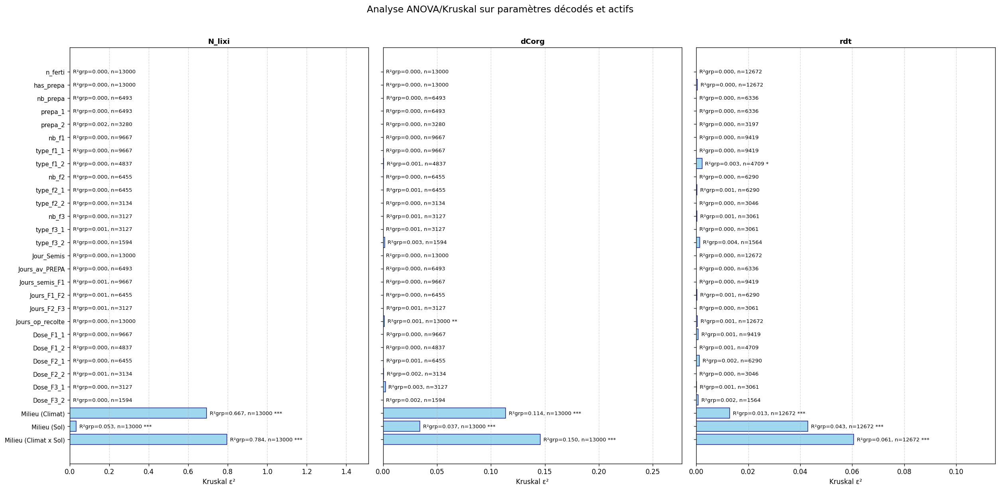

In [19]:
import scipy.stats as _stats
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)

# ============================================================
# 1. Reconstruction propre des paramètres depuis SMT/ADSG
# ============================================================

def build_clean_parameter_table(x_array, dsg_space):
    """
    Reconstruit un tableau propre des paramètres explorés.
    Les variables inactives sont mises à NaN.
    On n'utilise donc plus directement x0...x25.
    """

    rows = []
    decoded_data = dsg_space.decode_values(x_array)

    for row_data in decoded_data:
        p = parse_smt_row(row_data)
        fl = p["floats"]

        n_ferti = p["n_ferti"]
        has_prepa = p["has_prepa"]

        row = {
            # Structure globale
            "n_ferti": n_ferti,
            "has_prepa": "Oui" if has_prepa else "Non",

            # Préparation
            "nb_prepa": p["nb_prepa"] if has_prepa else np.nan,
            "prepa_1": p["prepa_t1"] if has_prepa else np.nan,
            "prepa_2": p["prepa_t2"] if has_prepa and p["nb_prepa"] == 2 else np.nan,

            # Fertilisation 1
            "nb_f1": p["nb_f1"] if n_ferti >= 1 else np.nan,
            "type_f1_1": p["f1_t1"] if n_ferti >= 1 else np.nan,
            "type_f1_2": p["f1_t2"] if n_ferti >= 1 and p["nb_f1"] == 2 else np.nan,

            # Fertilisation 2
            "nb_f2": p["nb_f2"] if n_ferti >= 2 else np.nan,
            "type_f2_1": p["f2_t1"] if n_ferti >= 2 else np.nan,
            "type_f2_2": p["f2_t2"] if n_ferti >= 2 and p["nb_f2"] == 2 else np.nan,

            # Fertilisation 3
            "nb_f3": p["nb_f3"] if n_ferti >= 3 else np.nan,
            "type_f3_1": p["f3_t1"] if n_ferti >= 3 else np.nan,
            "type_f3_2": p["f3_t2"] if n_ferti >= 3 and p["nb_f3"] == 2 else np.nan,

            # Variables continues
            "Jour_Semis": fl[0],

            "Jours_av_PREPA": fl[1] if has_prepa else np.nan,

            "Jours_semis_F1": fl[2] if n_ferti >= 1 else np.nan,
            "Jours_F1_F2": fl[3] if n_ferti >= 2 else np.nan,
            "Jours_F2_F3": fl[4] if n_ferti >= 3 else np.nan,
            "Jours_op_recolte": fl[5],

            "Dose_F1_1": fl[6] if n_ferti >= 1 else np.nan,
            "Dose_F1_2": fl[7] if n_ferti >= 1 and p["nb_f1"] == 2 else np.nan,

            "Dose_F2_1": fl[8] if n_ferti >= 2 else np.nan,
            "Dose_F2_2": fl[9] if n_ferti >= 2 and p["nb_f2"] == 2 else np.nan,

            "Dose_F3_1": fl[10] if n_ferti >= 3 else np.nan,
            "Dose_F3_2": fl[11] if n_ferti >= 3 and p["nb_f3"] == 2 else np.nan,
        }

        rows.append(row)

    return pd.DataFrame(rows)


# ============================================================
# 2. Préparation du dataset complet
# ============================================================

print("Aggregating data points for rigorous ANOVA/Kruskal analysis...")

if "_records" in globals() and _records:

    df_full = pd.concat(_records, ignore_index=True)

    # Tableau propre des paramètres, un par point du plan SMT
    params_by_point = build_clean_parameter_table(xt, agri_design_space)

    # Expansion vers les lignes de simulation
    params_expanded = params_by_point.iloc[df_full["point_idx"].values].reset_index(drop=True)

    # Fusion résultats MAELIA + paramètres propres
    df_full = pd.concat(
        [
            df_full.reset_index(drop=True),
            params_expanded.reset_index(drop=True)
        ],
        axis=1
    )

    # Variables environnementales comme facteurs catégoriels
    df_full["Milieu (Climat)"] = df_full["zone"].astype(str)
    df_full["Milieu (Sol)"] = df_full["sol_type"].astype(str)
    df_full["Milieu (Climat x Sol)"] = (
        df_full["zone"].astype(str) + " x " + df_full["sol_type"].astype(str)
    )

    print(f"Dataset: {len(df_full)} rows")
    print(f"Number of design points: {len(params_by_point)}")

    # ============================================================
    # 3. Métadonnées des variables
    # ============================================================

    VARIABLES = [
        {"col": "n_ferti", "label": "n_ferti", "type": "ordinal"},
        {"col": "has_prepa", "label": "has_prepa", "type": "categorical"},

        {"col": "nb_prepa", "label": "nb_prepa", "type": "ordinal"},
        {"col": "prepa_1", "label": "prepa_1", "type": "categorical"},
        {"col": "prepa_2", "label": "prepa_2", "type": "categorical"},

        {"col": "nb_f1", "label": "nb_f1", "type": "ordinal"},
        {"col": "type_f1_1", "label": "type_f1_1", "type": "categorical"},
        {"col": "type_f1_2", "label": "type_f1_2", "type": "categorical"},

        {"col": "nb_f2", "label": "nb_f2", "type": "ordinal"},
        {"col": "type_f2_1", "label": "type_f2_1", "type": "categorical"},
        {"col": "type_f2_2", "label": "type_f2_2", "type": "categorical"},

        {"col": "nb_f3", "label": "nb_f3", "type": "ordinal"},
        {"col": "type_f3_1", "label": "type_f3_1", "type": "categorical"},
        {"col": "type_f3_2", "label": "type_f3_2", "type": "categorical"},

        {"col": "Jour_Semis", "label": "Jour_Semis", "type": "continuous"},
        {"col": "Jours_av_PREPA", "label": "Jours_av_PREPA", "type": "continuous"},
        {"col": "Jours_semis_F1", "label": "Jours_semis_F1", "type": "continuous"},
        {"col": "Jours_F1_F2", "label": "Jours_F1_F2", "type": "continuous"},
        {"col": "Jours_F2_F3", "label": "Jours_F2_F3", "type": "continuous"},
        {"col": "Jours_op_recolte", "label": "Jours_op_recolte", "type": "continuous"},

        {"col": "Dose_F1_1", "label": "Dose_F1_1", "type": "continuous"},
        {"col": "Dose_F1_2", "label": "Dose_F1_2", "type": "continuous"},
        {"col": "Dose_F2_1", "label": "Dose_F2_1", "type": "continuous"},
        {"col": "Dose_F2_2", "label": "Dose_F2_2", "type": "continuous"},
        {"col": "Dose_F3_1", "label": "Dose_F3_1", "type": "continuous"},
        {"col": "Dose_F3_2", "label": "Dose_F3_2", "type": "continuous"},

        {"col": "Milieu (Climat)", "label": "Milieu (Climat)", "type": "categorical"},
        {"col": "Milieu (Sol)", "label": "Milieu (Sol)", "type": "categorical"},
        {"col": "Milieu (Climat x Sol)", "label": "Milieu (Climat x Sol)", "type": "categorical"},
    ]

    OUTPUTS = ["N_lixi", "dCorg", "rdt"]

    N_QUANTILE_BINS = 4
    MIN_GROUP_SIZE = 5
    MIN_TOTAL_N = 30

    # ============================================================
    # 4. Fonctions statistiques
    # ============================================================

    def make_groups_for_variable(df, var, output_col):
        col = var["col"]
        var_type = var["type"]

        sub = df[[col, output_col]].dropna().copy()

        if len(sub) < MIN_TOTAL_N:
            return None, sub, None

        if var_type == "continuous":
            try:
                sub["_group"] = pd.qcut(
                    sub[col],
                    q=N_QUANTILE_BINS,
                    duplicates="drop"
                )
                sub["_group"] = sub["_group"].cat.remove_unused_categories()
            except ValueError:
                return None, sub, None

        else:
            sub["_group"] = sub[col].astype(str)

        counts = sub["_group"].value_counts()
        valid_groups = counts[counts >= MIN_GROUP_SIZE].index
        sub = sub[sub["_group"].isin(valid_groups)].copy()

        if var_type == "continuous" and hasattr(sub["_group"], "cat"):
            sub["_group"] = sub["_group"].cat.remove_unused_categories()

        if sub["_group"].nunique() < 2:
            return None, sub, None

        group_counts = sub["_group"].value_counts()

        groups = [
            g[output_col].values
            for _, g in sub.groupby("_group", observed=True)
        ]

        return groups, sub, group_counts

    def kruskal_effect_size(groups):
        k = len(groups)
        n = sum(len(g) for g in groups)

        if k < 2 or n <= k:
            return np.nan, np.nan

        try:
            h_stat, p_value = _stats.kruskal(*groups)

            # Epsilon squared de Kruskal-Wallis
            eps2 = (h_stat - k + 1) / (n - k)
            eps2 = max(0.0, min(1.0, eps2))

            return eps2, p_value

        except Exception:
            return np.nan, np.nan

    def group_r2_from_sub(sub, output_col):
        y = sub[output_col].values
        y_mean = np.mean(y)
        ss_total = np.sum((y - y_mean) ** 2)

        if ss_total <= 1e-12:
            return np.nan

        ss_between = 0.0

        for _, g in sub.groupby("_group", observed=True):
            yg = g[output_col].values
            ss_between += len(yg) * (np.mean(yg) - y_mean) ** 2

        r2 = ss_between / ss_total
        return max(0.0, min(1.0, r2))

    def benjamini_hochberg(p_values):
        p_values = np.asarray(p_values, dtype=float)
        q_values = np.full_like(p_values, np.nan)

        valid = ~np.isnan(p_values)
        p = p_values[valid]

        if len(p) == 0:
            return q_values

        order = np.argsort(p)
        ranked_p = p[order]
        m = len(p)

        ranked_q = ranked_p * m / (np.arange(1, m + 1))
        ranked_q = np.minimum.accumulate(ranked_q[::-1])[::-1]
        ranked_q = np.minimum(ranked_q, 1.0)

        q = np.empty_like(p)
        q[order] = ranked_q
        q_values[valid] = q

        return q_values

    # ============================================================
    # 5. Calcul ANOVA/Kruskal
    # ============================================================

    all_results = []

    for output_col in OUTPUTS:
        if output_col not in df_full.columns:
            continue

        df_out = df_full.dropna(subset=[output_col]).copy()

        for var in VARIABLES:
            groups, sub, group_counts = make_groups_for_variable(df_out, var, output_col)

            if groups is None:
                all_results.append({
                    "output": output_col,
                    "variable": var["label"],
                    "column": var["col"],
                    "type": var["type"],
                    "n_used": len(sub),
                    "n_groups": 0 if group_counts is None else len(group_counts),
                    "min_group_size": np.nan if group_counts is None or len(group_counts) == 0 else int(group_counts.min()),
                    "max_group_size": np.nan if group_counts is None or len(group_counts) == 0 else int(group_counts.max()),
                    "kruskal_epsilon2": np.nan,
                    "group_r2": np.nan,
                    "p_value": np.nan,
                })
                continue

            eps2, p_value = kruskal_effect_size(groups)
            r2_group = group_r2_from_sub(sub, output_col)

            all_results.append({
                "output": output_col,
                "variable": var["label"],
                "column": var["col"],
                "type": var["type"],
                "n_used": len(sub),
                "n_groups": sub["_group"].nunique(),
                "min_group_size": int(sub["_group"].value_counts().min()),
                "max_group_size": int(sub["_group"].value_counts().max()),
                "kruskal_epsilon2": eps2,
                "group_r2": r2_group,
                "p_value": p_value,
            })

    results_df = pd.DataFrame(all_results)

    results_df["q_value_fdr"] = np.nan

    for output_col in results_df["output"].dropna().unique():
        mask = results_df["output"] == output_col
        results_df.loc[mask, "q_value_fdr"] = benjamini_hochberg(
            results_df.loc[mask, "p_value"].values
        )

    results_df_sorted = results_df.sort_values(
        ["output", "kruskal_epsilon2"],
        ascending=[True, False]
    )

    print("ANOVA/Kruskal results table:")
    display(results_df_sorted)

    # ============================================================
    # 6. Graphique final
    # ============================================================

    plot_outputs = [o for o in OUTPUTS if o in results_df["output"].unique()]

    if plot_outputs:
        fig, axes = plt.subplots(
            1,
            len(plot_outputs),
            figsize=(7 * len(plot_outputs), 10),
            sharey=True
        )

        if len(plot_outputs) == 1:
            axes = [axes]

        ordered_labels = [v["label"] for v in VARIABLES]

        for ax, output_col in zip(axes, plot_outputs):
            subres = results_df[results_df["output"] == output_col].copy()
            subres = subres.set_index("variable").reindex(ordered_labels).reset_index()

            y_pos = np.arange(len(subres))
            vals = subres["kruskal_epsilon2"].fillna(0.0).values

            ax.barh(
                y_pos,
                vals,
                color="skyblue",
                edgecolor="navy",
                alpha=0.8
            )

            ax.set_yticks(y_pos)
            ax.set_yticklabels(subres["variable"], fontsize=9)
            ax.set_xlabel("Kruskal ε²", fontsize=10)
            ax.set_title(output_col, fontsize=11, fontweight="bold")
            ax.invert_yaxis()
            ax.grid(axis="x", linestyle="--", alpha=0.5)

            x_max = max(float(np.nanmax(vals)), 0.01)
            ax.set_xlim(0, x_max * 1.90)

            for i, row in subres.iterrows():
                eps2 = row["kruskal_epsilon2"]
                r2 = row["group_r2"]
                q = row["q_value_fdr"]
                n_used = row["n_used"]

                if np.isnan(eps2):
                    label = "NA"
                    x_text = x_max * 0.01
                else:
                    sig = ""
                    if not np.isnan(q):
                        if q < 0.001:
                            sig = "***"
                        elif q < 0.01:
                            sig = "**"
                        elif q < 0.05:
                            sig = "*"

                    label = f"R²grp={r2:.3f}, n={int(n_used)} {sig}"
                    x_text = eps2 + x_max * 0.02

                ax.text(
                    x_text,
                    i,
                    label,
                    va="center",
                    ha="left",
                    fontsize=8
                )

        plt.suptitle(
            "Analyse ANOVA/Kruskal sur paramètres décodés et actifs",
            fontsize=14,
            y=1.02
        )

        plt.tight_layout()
        plt.show()

else:
    print("No simulation records found. Run the simulation collection cell first.")

## Matrices sols x climats


Matrice 3x3 pour la sortie : N_lixi
Lignes = types de sols ; colonnes = types de climats


climat_label,beauce,oceanique,sudouest
sol_label,,,
limoneux,2.081777,12.114994,20.552536
limono-sableux,1.724620,11.532565,13.904462
argilo-calcaire,2.575035,11.292283,11.288863



Matrice 3x3 pour la sortie : dCorg
Lignes = types de sols ; colonnes = types de climats


climat_label,beauce,oceanique,sudouest
sol_label,,,
limoneux,-332.346946,-382.798894,-479.374179
limono-sableux,-267.768913,-305.845659,-386.615388
argilo-calcaire,-291.949932,-319.968600,-415.040506



Matrice 3x3 pour la sortie : rdt
Lignes = types de sols ; colonnes = types de climats


climat_label,beauce,oceanique,sudouest
sol_label,,,
limoneux,4.911774,4.550909,5.298039
limono-sableux,4.526033,4.150123,4.494272
argilo-calcaire,4.306503,4.085915,4.360844



Matrice des effectifs utilisés
Lignes = types de sols ; colonnes = types de climats


climat_label,beauce,oceanique,sudouest
sol_label,,,
limoneux,1600,900,1700
limono-sableux,1800,900,1700
argilo-calcaire,1700,900,1800


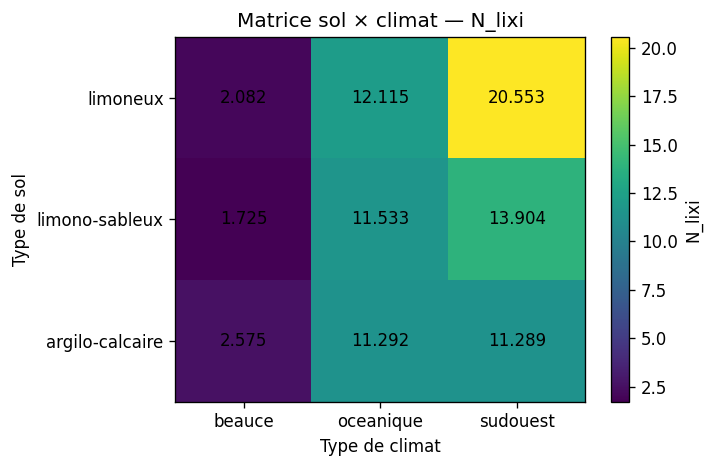

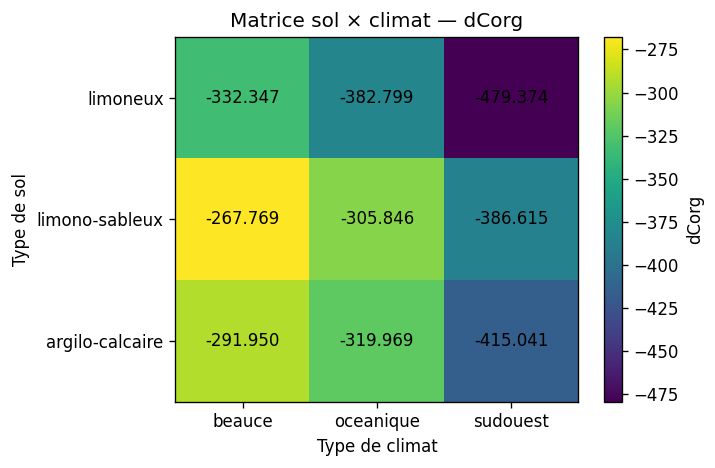

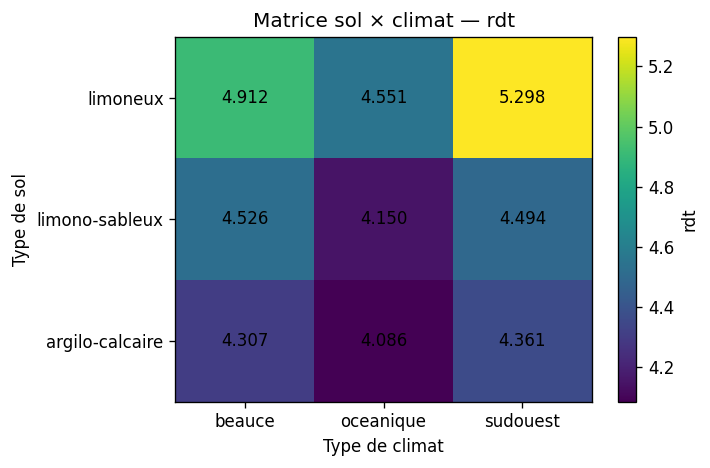

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display

# ============================================================
# 1. Table de correspondance climat x sol fournie
# ============================================================

terrain_matrix_info = pd.DataFrame([
    {
        "CONTEXTE_CLIMATIQUE": "beauce",
        "ID_PDG_METEO": 13218,
        "ID_SOL": "18960_27491",
        "ZONE_PEDO": "limoneux",
        "nombre_ilots": 16,
    },
    {
        "CONTEXTE_CLIMATIQUE": "beauce",
        "ID_PDG_METEO": 13218,
        "ID_SOL": "330104_330367_1",
        "ZONE_PEDO": "limono-sableux",
        "nombre_ilots": 18,
    },
    {
        "CONTEXTE_CLIMATIQUE": "beauce",
        "ID_PDG_METEO": 13218,
        "ID_SOL": "330151_330489_1",
        "ZONE_PEDO": "argilo-calcaire",
        "nombre_ilots": 17,
    },
    {
        "CONTEXTE_CLIMATIQUE": "oceanique",
        "ID_PDG_METEO": 13761,
        "ID_SOL": "18960_27491",
        "ZONE_PEDO": "limoneux",
        "nombre_ilots": 9,
    },
    {
        "CONTEXTE_CLIMATIQUE": "oceanique",
        "ID_PDG_METEO": 13761,
        "ID_SOL": "330104_330367_1",
        "ZONE_PEDO": "limono-sableux",
        "nombre_ilots": 9,
    },
    {
        "CONTEXTE_CLIMATIQUE": "oceanique",
        "ID_PDG_METEO": 13761,
        "ID_SOL": "330151_330489_1",
        "ZONE_PEDO": "argilo-calcaire",
        "nombre_ilots": 9,
    },
    {
        "CONTEXTE_CLIMATIQUE": "sudouest",
        "ID_PDG_METEO": 4756,
        "ID_SOL": "18960_27491",
        "ZONE_PEDO": "limoneux",
        "nombre_ilots": 17,
    },
    {
        "CONTEXTE_CLIMATIQUE": "sudouest",
        "ID_PDG_METEO": 4756,
        "ID_SOL": "330104_330367_1",
        "ZONE_PEDO": "limono-sableux",
        "nombre_ilots": 17,
    },
    {
        "CONTEXTE_CLIMATIQUE": "sudouest",
        "ID_PDG_METEO": 4756,
        "ID_SOL": "330151_330489_1",
        "ZONE_PEDO": "argilo-calcaire",
        "nombre_ilots": 18,
    },
])

# ============================================================
# 2. Ordre explicite des lignes et colonnes
# ============================================================

soil_order = [
    "limoneux",
    "limono-sableux",
    "argilo-calcaire",
]

climate_order = [
    "beauce",
    "oceanique",
    "sudouest",
]

outputs = [
    "N_lixi",
    "dCorg",
    "rdt",
]

# ============================================================
# 3. Normalisation des noms dans df_full
# ============================================================
# Hypothèse : df_full contient les colonnes :
# - zone : climat ou contexte climatique
# - sol_type : identifiant de sol ou nom de zone pédologique
#
# Si sol_type contient déjà "limoneux", "limono-sableux", etc.,
# le mapping ne change rien.
# Si sol_type contient l'ID_SOL, on le convertit en ZONE_PEDO.

soil_id_to_name = dict(
    zip(
        terrain_matrix_info["ID_SOL"].astype(str),
        terrain_matrix_info["ZONE_PEDO"].astype(str)
    )
)

df_matrix = df_full.copy()

df_matrix["climat_label"] = df_matrix["zone"].astype(str).str.lower()
df_matrix["sol_label"] = df_matrix["sol_type"].astype(str)

df_matrix["sol_label"] = (
    df_matrix["sol_label"]
    .map(soil_id_to_name)
    .fillna(df_matrix["sol_label"])
    .astype(str)
    .str.lower()
)

# Harmonisation minimale des accents / variantes éventuelles
df_matrix["climat_label"] = (
    df_matrix["climat_label"]
    .str.replace("océanique", "oceanique", regex=False)
)

df_matrix["sol_label"] = (
    df_matrix["sol_label"]
    .str.replace("limono sableux", "limono-sableux", regex=False)
    .str.replace("argilo calcaire", "argilo-calcaire", regex=False)
)

# ============================================================
# 4. Création d'une matrice 3x3 pour chaque sortie
# ============================================================

matrices_3x3 = {}

for output in outputs:
    if output not in df_matrix.columns:
        print(f"Sortie absente de df_full : {output}")
        continue

    matrix = (
        df_matrix
        .pivot_table(
            index="sol_label",
            columns="climat_label",
            values=output,
            aggfunc="mean"
        )
        .reindex(index=soil_order, columns=climate_order)
    )

    matrices_3x3[output] = matrix

    print("\n" + "=" * 70)
    print(f"Matrice 3x3 pour la sortie : {output}")
    print("Lignes = types de sols ; colonnes = types de climats")
    display(matrix)

# ============================================================
# 5. Matrice des effectifs pour vérifier les combinaisons
# ============================================================

count_matrix = (
    df_matrix
    .pivot_table(
        index="sol_label",
        columns="climat_label",
        values=outputs[0],
        aggfunc="count"
    )
    .reindex(index=soil_order, columns=climate_order)
)

print("\n" + "=" * 70)
print("Matrice des effectifs utilisés")
print("Lignes = types de sols ; colonnes = types de climats")
display(count_matrix)

# ============================================================
# 6. Visualisation optionnelle : une heatmap par sortie
# ============================================================

for output, matrix in matrices_3x3.items():
    fig, ax = plt.subplots(figsize=(6, 4))

    im = ax.imshow(matrix.values, aspect="auto")

    ax.set_xticks(np.arange(len(climate_order)))
    ax.set_yticks(np.arange(len(soil_order)))

    ax.set_xticklabels(climate_order)
    ax.set_yticklabels(soil_order)

    ax.set_xlabel("Type de climat")
    ax.set_ylabel("Type de sol")
    ax.set_title(f"Matrice sol × climat — {output}")

    for i in range(len(soil_order)):
        for j in range(len(climate_order)):
            value = matrix.iloc[i, j]
            label = "NA" if pd.isna(value) else f"{value:.3f}"
            ax.text(j, i, label, ha="center", va="center")

    plt.colorbar(im, ax=ax, label=output)
    plt.tight_layout()
    plt.show()

## 7. Export pour les métamodèles

Génère le fichier `dataset_metamodel.csv` contenant les 28 features (26 SMT + 2 env) et les 3 sorties.

In [38]:
# --- 8. Export for Metamodeling (13,000 points) ---
import pandas as pd
import numpy as np

print("Collecte des résultats et fusion avec le plan d'expérience (13,000 points)...")

_records = []
parc_to_idx = {p: k for k, p in enumerate(ALL_PARCELLES)}

for nom_simu, out_dir in results.items():
    if not (out_dir and out_dir.exists()): continue
    sim_idx = int(nom_simu.split('_')[-1])
    
    df = read_simulation_outputs(out_dir)
    if df.empty: continue
    
    # Mapper chaque parcelle à son point DOE spécifique
    df['point_idx'] = sim_idx * len(ALL_PARCELLES) + df['parcelle'].map(parc_to_idx)
    
    # Calculer la moyenne par parcelle (sur les années de simulation) pour N_lixi, dCorg, rdt
    df_parc = df.groupby(['parcelle', 'point_idx', 'zone', 'sol_type']).agg({
        'N_lixi': 'mean', 'dCorg': 'mean', 'rdt': 'mean'
    }).reset_index()
    
    _records.append(df_parc)

if _records:
    df_full = pd.concat(_records, ignore_index=True)
    
    # Ajouter les caractéristiques agricoles (x0...x25) depuis xt
    # xt contient les 13,000 points
    point_indices = df_full['point_idx'].values
    xt_subset = xt[point_indices]
    
    for j in range(xt.shape[1]):
        df_full[f'feat_{j}'] = xt_subset[:, j]
    
    # Ajout des milieux agrégés (Climat / Sol)
    zone_map = {z: i for i, z in enumerate(sorted(df_full['zone'].unique()))}
    soil_map = {s: i for i, s in enumerate(sorted(df_full['sol_type'].unique()))}
    
    df_full['Milieu (Climat)'] = df_full['zone'].map(zone_map)
    df_full['Milieu (Sol)']    = df_full['sol_type'].map(soil_map)
    
    # Réorganiser les colonnes pour les métamodèles (26 agri + 2 env + 3 outputs)
    X_agri_names = [f'feat_{j}' for j in range(26)]
    export_cols = X_agri_names + ['Milieu (Climat)', 'Milieu (Sol)', 'N_lixi', 'dCorg', 'rdt', 'point_idx', 'parcelle']
    
    df_export = df_full[export_cols]
    export_path = XML_DIR / 'dataset_metamodel.csv'
    df_export.to_csv(export_path, index=False)
    
    print(f"Export réussi : {export_path}")
    print(f"Nombre de points : {len(df_export)}")
    print(f"Structure : 26 agri + 2 env + 3 sorties")
else:
    print("Aucune donnée collectée.")


Collecte des résultats et fusion avec le plan d'expérience (13,000 points)...
Export réussi : /tmp/maelia_smt_xml/dataset_metamodel.csv
Nombre de points : 13000
Structure : 26 agri + 2 env + 3 sorties
